In [ ]:
# Importing Libraries

import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Ignoring Warnings

import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Importing Rentsmart Dataset

rentsmart = pd.read_csv("Rentsmart.csv")
rentsmart.head()

,date,violation_type,description,address,neighborhood,zip_code,parcel,owner,year built,year remodeled,property_type,latitude,longitude
0,2022-11-20T00:00:00,Enforcement Violations,Improper storage trash: res,"325-327 Dorchester St, 02127",South Boston,2127,700214040,THREE-25 -327 DORCHESTER ST CONDO TR,1928.0,2010.0,Condominium Main*,42.33124,-71.05411
1,2022-11-20T00:00:00,Enforcement Violations,Improper storage trash: res,"7 Aberdeen St, 02215",Boston,2215,2100139000,SEVEN 21 ABERDEEN STREET,1999.0,1999.0,Condominium Main*,42.34642,-71.10403
2,2022-11-20T00:00:00,Enforcement Violations,Improper storage trash: res,"62 H St, 02127",South Boston,2127,603197000,SIXTY-2 H STREET CONDO TR,1890.0,2009.0,Condominium Main*,42.33589,-71.04138
3,2022-11-19T00:00:00,Enforcement Violations,Occupying City prop wo permit,"9 Anderson St, 02114",Boston,2114,502218000,EMERALD REALTY CAPITAL LLC MASS LLC,1899.0,2014.0,Residential 7 or more units,42.36076,-71.06799
4,2022-11-19T00:00:00,Enforcement Violations,Improper storage trash: res,"9 Anderson St, 02114",Boston,2114,502218000,EMERALD REALTY CAPITAL LLC MASS LLC,1899.0,2014.0,Residential 7 or more units,42.36076,-71.06799


In [ ]:
# Importing Chi-Square Test from Scipy

from scipy.stats import chi2_contingency

In [ ]:
# Creating a Cross-Tab between violation_type and neighborhood (to be used further for Chi-Square analysis)

cross_tab = pd.crosstab(index = rentsmart['violation_type'], columns = rentsmart['neighborhood'])
print(cross_tab)

neighborhood                Allston  Boston  Brighton  Charlestown  \
violation_type                                                       
Building Violations              65     596       118           64   
Civic Maintenance Requests       79     655       234          139   
Enforcement Violations        12894   46602     13961         4845   
Housing Complaints             1849    7533      2721         1418   
Housing Violations               60     151        71            7   
Sanitation Requests            1248    5301      2819          709   

neighborhood                Chestnut Hill  Dorchester  East Boston  Hyde Park  \
violation_type                                                                  
Building Violations                     0         946          336        162   
Civic Maintenance Requests             11        1033          490        283   
Enforcement Violations                 32       46579        10490       5341   
Housing Complaints                

In [ ]:
# Finding the Chi-Square between violation_type and neighborhood 

ChiSq = chi2_contingency(cross_tab)
ChiSq

(13392.71947080252,
 0.0,
 70,
 array([[1.71436648e+02, 6.44017462e+02, 2.10911008e+02, 7.60270457e+01,
         9.31548319e-01, 7.84300170e+02, 1.86108534e+02, 1.04407512e+02,
         1.22096344e+02, 1.55092209e+02, 1.28214923e+02, 9.28160870e+01,
         3.38416684e+02, 2.24143228e+02, 4.80805962e+01],
        [2.60049628e+02, 9.76900232e+02, 3.19927681e+02, 1.15324262e+02,
         1.41305139e+00, 1.18969293e+03, 2.82305187e+02, 1.58374157e+02,
         1.85206076e+02, 2.35256999e+02, 1.94487255e+02, 1.40791302e+02,
         5.13339089e+02, 3.39999433e+02, 7.29327206e+01],
        [1.08698763e+04, 4.08336852e+04, 1.33727332e+04, 4.82046627e+03,
         5.90644711e+01, 4.97282576e+04, 1.18001417e+04, 6.61991908e+03,
         7.74147284e+03, 9.83356326e+03, 8.12941903e+03, 5.88496913e+03,
         2.14571827e+04, 1.42117172e+04, 3.04853214e+03],
        [2.82101169e+03, 1.05973886e+04, 3.47056726e+03, 1.25103464e+03,
         1.53287452e+01, 1.29057583e+04, 3.06243942e+03, 1.718038

<AxesSubplot:xlabel='violation_type'>

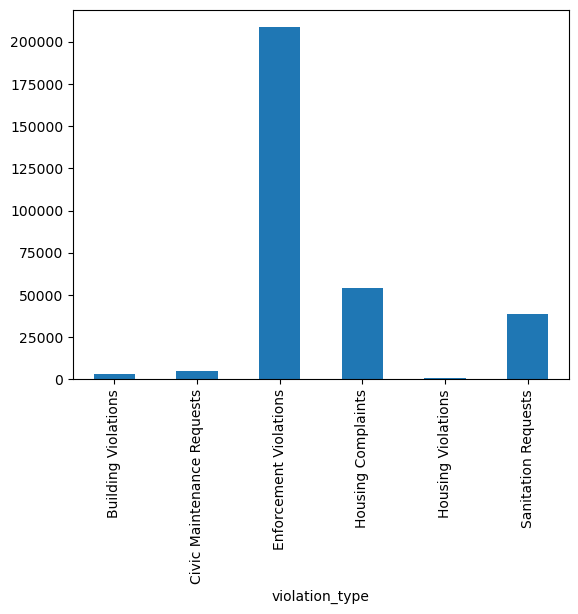

In [ ]:
# Plotting graph for the number of violations of each type

rentsmart.groupby(['violation_type'])['property_type'].count().plot(kind = 'bar')

In [ ]:
# Importing Folium

import folium

In [ ]:
# Finding the 50 owners with most number of violations (the more times they've occured, the more violations they have)

most_occuring_owners = dict(rentsmart.groupby(['owner'])['owner'].count().nlargest(n = 50))

In [ ]:
# Extracting the coordinates for the 50 owners with most violations (all coordinates where they have violations)

coords = {}
for i in range(rentsmart.shape[0]):
    if rentsmart['owner'][i] in most_occuring_owners.keys():
        if rentsmart['owner'][i] in coords.keys():
            coords[rentsmart['owner'][i]].append((rentsmart['latitude'][i], rentsmart['longitude'][i]))
        else:
            coords[rentsmart['owner'][i]] = [(rentsmart['latitude'][i], rentsmart['longitude'][i])]

In [ ]:
# Printing the extracted coords

coords

{'FORTY ANDERSON STREET LLC MASS LLC': [(42.35984000016753,
   -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.35984000016753, -71.06760000133919),
  (42.3598400

In [ ]:
# Printing the length of the coords variable just to verify if it has 50 entires (i.e. 50 owners)

len(coords)

50

In [ ]:
# Generating 50 random colors (to plot the coordinates of the 50 house owners)

import random

def random_color():
    return "#{}{}{}{}{}{}".format(*(random.choice("0123456789abcdef") for _ in range(6)))

colors = [random_color() for _ in range(50)]

In [ ]:
# Verifying if the colors were generated properly

print(colors)

['#2c5dad', '#52352f', '#9a8fbc', '#fc1611', '#5e8ead', '#c72b31', '#b0b163', '#8c99f4', '#c432f2', '#11d106', '#e83937', '#a14a85', '#14d0b6', '#d837de', '#635d9f', '#96aeb0', '#9df98d', '#2068bb', '#1b00ca', '#0d7cf3', '#87adc9', '#f87ac0', '#e7bceb', '#32eaac', '#ca21d5', '#d7d1a6', '#815bd3', '#cb7f92', '#e1088b', '#e4d0ed', '#2f436d', '#b64f9f', '#5399ba', '#6e35a5', '#9a5894', '#b39a43', '#e1419d', '#ae715b', '#b73cf5', '#beb0e8', '#abfe32', '#4c4155', '#a2d873', '#ffab24', '#e4773c', '#0cd55b', '#ddadc8', '#6be77d', '#7e1ef4', '#9b00cf']


In [ ]:
# Plotting all coordinates on Boston city's Map

boston_map = folium.Map(location = [42.3601, -71.0589], zoom_start = 11)
color_mapping = {}
count = 0

for i in coords:
    for j in range(len(coords[i])):
        color_mapping[i] = colors[count]
        folium.vector_layers.CircleMarker(
            location = [coords[i][j][0], coords[i][j][1]],
            radius = 5, 
            weight = 2,
            fill = True, 
            fill_color = colors[count],
            color = colors[count]
        ).add_to(boston_map)
    count+=1
boston_map.save("top_50_house_owners.html")

In [ ]:
# Displaying the map

display(boston_map)

In [ ]:
# Printing which color corresponds to which owner in the map

color_mapping

{'FORTY ANDERSON STREET LLC MASS LLC': '#2c5dad',
 'MAGUIRE ROBERT G': '#52352f',
 'FREEDMAN LILLIAN Z TS': '#9a8fbc',
 'SELMASSON HOLDINGS LLC MASS LLC': '#fc1611',
 'BOBSON RESIDENTIAL LLC': '#5e8ead',
 'COMMONWEALTH ELEVEN 37': '#c72b31',
 'GBM PORTFOLIO OWNER LLC': '#b0b163',
 'CUONG VU': '#8c99f4',
 'GERALD THOMAS': '#c432f2',
 'ROIFF PAUL G': '#11d106',
 'NORTH STREET VENTURES LLC': '#e83937',
 'DIARBAKERLY NAGEEB TS': '#a14a85',
 'STANDARD DORCHESTER LLC': '#14d0b6',
 'ROIFF PAUL G TS': '#d837de',
 'PD LAND TRUST LLC TS': '#635d9f',
 'KEVIN RYAN REAL ESTATE LLC': '#96aeb0',
 'MHB REALTY LLC MASS LLC': '#9df98d',
 'SOLSKINN PROPERTIES LLC': '#2068bb',
 'HS LAND TRUST LLC TS': '#1b00ca',
 'TS LAND TRUST LLC': '#0d7cf3',
 'PNC ARHPF BLUE MOUNTAIN APTS LLC': '#87adc9',
 'JPNDC  PITTS  LLC': '#f87ac0',
 'LDJ DEVELOPMENT LLC': '#e7bceb',
 'DUMBAUGH CHARLES C TS': '#32eaac',
 'HARVEY VINA': '#ca21d5',
 'CESCO LLC MASS LLC': '#d7d1a6',
 'TS LAND TRUST LLC TS': '#815bd3',
 'PROJECT 77 LL

In [ ]:
# Printing the various colors used (cannot correlate the HEX codes with the colors unless we see them)

from IPython.display import Markdown, display

display(Markdown('<br>'.join(
    f'<span style="font-family: monospace">{color} <span style="color: {color}">████████</span></span>'
    for color in colors
)))

<span style="font-family: monospace">#2c5dad <span style="color: #2c5dad">████████</span></span><br><span style="font-family: monospace">#52352f <span style="color: #52352f">████████</span></span><br><span style="font-family: monospace">#9a8fbc <span style="color: #9a8fbc">████████</span></span><br><span style="font-family: monospace">#fc1611 <span style="color: #fc1611">████████</span></span><br><span style="font-family: monospace">#5e8ead <span style="color: #5e8ead">████████</span></span><br><span style="font-family: monospace">#c72b31 <span style="color: #c72b31">████████</span></span><br><span style="font-family: monospace">#b0b163 <span style="color: #b0b163">████████</span></span><br><span style="font-family: monospace">#8c99f4 <span style="color: #8c99f4">████████</span></span><br><span style="font-family: monospace">#c432f2 <span style="color: #c432f2">████████</span></span><br><span style="font-family: monospace">#11d106 <span style="color: #11d106">████████</span></span><br><span style="font-family: monospace">#e83937 <span style="color: #e83937">████████</span></span><br><span style="font-family: monospace">#a14a85 <span style="color: #a14a85">████████</span></span><br><span style="font-family: monospace">#14d0b6 <span style="color: #14d0b6">████████</span></span><br><span style="font-family: monospace">#d837de <span style="color: #d837de">████████</span></span><br><span style="font-family: monospace">#635d9f <span style="color: #635d9f">████████</span></span><br><span style="font-family: monospace">#96aeb0 <span style="color: #96aeb0">████████</span></span><br><span style="font-family: monospace">#9df98d <span style="color: #9df98d">████████</span></span><br><span style="font-family: monospace">#2068bb <span style="color: #2068bb">████████</span></span><br><span style="font-family: monospace">#1b00ca <span style="color: #1b00ca">████████</span></span><br><span style="font-family: monospace">#0d7cf3 <span style="color: #0d7cf3">████████</span></span><br><span style="font-family: monospace">#87adc9 <span style="color: #87adc9">████████</span></span><br><span style="font-family: monospace">#f87ac0 <span style="color: #f87ac0">████████</span></span><br><span style="font-family: monospace">#e7bceb <span style="color: #e7bceb">████████</span></span><br><span style="font-family: monospace">#32eaac <span style="color: #32eaac">████████</span></span><br><span style="font-family: monospace">#ca21d5 <span style="color: #ca21d5">████████</span></span><br><span style="font-family: monospace">#d7d1a6 <span style="color: #d7d1a6">████████</span></span><br><span style="font-family: monospace">#815bd3 <span style="color: #815bd3">████████</span></span><br><span style="font-family: monospace">#cb7f92 <span style="color: #cb7f92">████████</span></span><br><span style="font-family: monospace">#e1088b <span style="color: #e1088b">████████</span></span><br><span style="font-family: monospace">#e4d0ed <span style="color: #e4d0ed">████████</span></span><br><span style="font-family: monospace">#2f436d <span style="color: #2f436d">████████</span></span><br><span style="font-family: monospace">#b64f9f <span style="color: #b64f9f">████████</span></span><br><span style="font-family: monospace">#5399ba <span style="color: #5399ba">████████</span></span><br><span style="font-family: monospace">#6e35a5 <span style="color: #6e35a5">████████</span></span><br><span style="font-family: monospace">#9a5894 <span style="color: #9a5894">████████</span></span><br><span style="font-family: monospace">#b39a43 <span style="color: #b39a43">████████</span></span><br><span style="font-family: monospace">#e1419d <span style="color: #e1419d">████████</span></span><br><span style="font-family: monospace">#ae715b <span style="color: #ae715b">████████</span></span><br><span style="font-family: monospace">#b73cf5 <span style="color: #b73cf5">████████</span></span><br><span style="font-family: monospace">#beb0e8 <span style="color: #beb0e8">████████</span></span><br><span style="font-family: monospace">#abfe32 <span style="color: #abfe32">████████</span></span><br><span style="font-family: monospace">#4c4155 <span style="color: #4c4155">████████</span></span><br><span style="font-family: monospace">#a2d873 <span style="color: #a2d873">████████</span></span><br><span style="font-family: monospace">#ffab24 <span style="color: #ffab24">████████</span></span><br><span style="font-family: monospace">#e4773c <span style="color: #e4773c">████████</span></span><br><span style="font-family: monospace">#0cd55b <span style="color: #0cd55b">████████</span></span><br><span style="font-family: monospace">#ddadc8 <span style="color: #ddadc8">████████</span></span><br><span style="font-family: monospace">#6be77d <span style="color: #6be77d">████████</span></span><br><span style="font-family: monospace">#7e1ef4 <span style="color: #7e1ef4">████████</span></span><br><span style="font-family: monospace">#9b00cf <span style="color: #9b00cf">████████</span></span>

In [ ]:
# Extracting the coordinates of one of the biggest looking blocks on Boston's map (TENANTS DEVELOPMENT II LP)

x = coords['TENANTS DEVELOPMENT II LP']

In [ ]:
# Plotting the violation coordinates of TENANTS DEVELOPMENT II LP

ton_map_test = folium.Map(location = [42.3601, -71.0589], zoom_start = 11)
color_mapping = {}
count = 0

for i in range(len(x)):
    color_mapping[i] = colors[0]
    folium.vector_layers.CircleMarker(
        location = [x[i][0], x[i][1]],
        radius = 5, 
        weight = 2,
        fill = True, 
        fill_color = colors[0],
        color = colors[0]
    ).add_to(boston_map_test)
    #count+=1
boston_map_test.save("block_1.html")

In [ ]:
# Displaying the map

display(boston_map_test)

In [ ]:
# Extracting the violations of only TENANTS DEVELOPMENT II LP from the Rentsmart dataset

df_block_1 = rentsmart[rentsmart.owner.str.contains('TENANTS DEVELOPMENT II LP',case = False)]
df_block_1.head()

,date,violation_type,description,address,neighborhood,zip_code,parcel,owner,year built,year remodeled,property_type,latitude,longitude
4300,2022-10-28T00:00:00,Enforcement Violations,Improper storage trash: res,"506 Columbus Ave, 02118",Roxbury,2118,402687000,TENANTS DEVELOPMENT II LP,1905.0,2003.0,Residential 7 or more units,42.342230,-71.079350
4517,2022-10-27T00:00:00,Enforcement Violations,Improper storage trash: res,"692 Massachusetts Ave, 02118",Roxbury,2118,801529000,TENANTS DEVELOPMENT II LP,1905.0,2003.0,Residential 7 or more units,42.335400,-71.075230
5461,2022-10-24T00:00:00,Enforcement Violations,Improper storage trash: res,"692 Massachusetts Ave, 02118",Roxbury,2118,801529000,TENANTS DEVELOPMENT II LP,1905.0,2003.0,Residential 7 or more units,42.335400,-71.075230
6732,2022-10-18T08:42:37,Sanitation Requests,Rodent Activity,"57 Worcester St, 02118",Roxbury,2118,900553000,TENANTS DEVELOPMENT II LP,1910.0,2003.0,Residential 7 or more units,42.339050,-71.077270
7375,2022-10-16T00:00:00,Enforcement Violations,Improper storage trash: res,"545 Massachusetts Ave, 02118",Roxbury,2118,900921000,TENANTS DEVELOPMENT II LP,1905.0,2003.0,Residential 7 or more units,42.338007,-71.079631


In [ ]:
# Describing the violation data of TENANTS DEVELOPMENT II LP

df_block_1.describe()

,zip_code,parcel,year built,year remodeled,latitude,longitude
count,322.000000,3.220000e+02,322.000000,322.000000,322.000000,322.000000
mean,2117.962733,7.757806e+08,1905.450311,2001.922360,42.338643,-71.078414
std,0.270875,1.927215e+08,3.445031,5.024879,0.002601,0.002520
min,2116.000000,4.005110e+08,1890.000000,1974.000000,42.335300,-71.083040
25%,2118.000000,8.014880e+08,1905.000000,2003.000000,42.336690,-71.079631
50%,2118.000000,9.006145e+08,1905.000000,2003.000000,42.337961,-71.077680
75%,2118.000000,9.009220e+08,1905.000000,2003.000000,42.340840,-71.076550
max,2118.000000,9.010010e+08,1910.000000,2003.000000,42.344050,-71.075130


In [ ]:
# Printing the number of violations of each type by TENANTS DEVELOPMENT II LP

df_block_1['violation_type'].value_counts()

Enforcement Violations        255
Sanitation Requests            38
Housing Complaints             26
Civic Maintenance Requests      2
Building Violations             1
Name: violation_type, dtype: int64

In [ ]:
# Extracting the coordinates of one of the biggest looking blocks on Boston's map (FRANKLIN HIGHLANDS LP)

x = coords['FRANKLIN HIGHLANDS LP']

In [ ]:
# Plotting the violation coordinates of FRANKLIN HIGHLANDS LP

boston_map_test = folium.Map(location = [42.3601, -71.0589], zoom_start = 11)
color_mapping = {}
count = 0

for i in range(len(x)):
    color_mapping[i] = colors[0]
    folium.vector_layers.CircleMarker(
        location = [x[i][0], x[i][1]],
        radius = 5, 
        weight = 2,
        fill = True, 
        fill_color = colors[0],
        color = colors[0]
    ).add_to(boston_map_test)
    #count+=1
boston_map_test.save("block_2.html")

In [ ]:
# Displaying the map

display(boston_map_test)

In [ ]:
# Extracting the violations of only FRANKLIN HIGHLANDS LP from the Rentsmart dataset

df_block_2 = rentsmart[rentsmart.owner.str.contains('FRANKLIN HIGHLANDS LP',case = False)]
df_block_2.head()

,date,violation_type,description,address,neighborhood,zip_code,parcel,owner,year built,year remodeled,property_type,latitude,longitude
1941,2022-11-09T00:00:00,Enforcement Violations,Improper storage trash: res,"109-115 Homestead St, 02121",Dorchester,2121,1202269000,FRANKLIN HIGHLANDS LP,NaN,NaN,Mixed Use (Res. and Comm.),42.31131,-71.08972
7731,2022-10-14T00:00:00,Enforcement Violations,Improper storage trash: res,"63-67 Brookledge St, 02121",Dorchester,2121,1202341000,FRANKLIN HIGHLANDS LP,NaN,NaN,Mixed Use (Res. and Comm.),42.30874,-71.08921
7737,2022-10-14T00:00:00,Enforcement Violations,Overfilling of barrel/dumpster,"63-67 Brookledge St, 02121",Dorchester,2121,1202341000,FRANKLIN HIGHLANDS LP,NaN,NaN,Mixed Use (Res. and Comm.),42.30874,-71.08921
13226,2022-09-21T00:00:00,Enforcement Violations,Overfilling of barrel/dumpster,"63-67 Brookledge St, 02121",Dorchester,2121,1202341000,FRANKLIN HIGHLANDS LP,NaN,NaN,Mixed Use (Res. and Comm.),42.30874,-71.08921
13227,2022-09-21T00:00:00,Enforcement Violations,Improper storage trash: res,"63-67 Brookledge St, 02121",Dorchester,2121,1202341000,FRANKLIN HIGHLANDS LP,NaN,NaN,Mixed Use (Res. and Comm.),42.30874,-71.08921


In [ ]:
# Describing the violation data of FRANKLIN HIGHLANDS LP

df_block_2.describe()

,zip_code,parcel,year built,year remodeled,latitude,longitude
count,223.0,2.230000e+02,41.000000,9.0,223.000000,223.000000
mean,2121.0,1.202304e+09,1910.243902,1970.0,42.310660,-71.089867
std,0.0,1.080515e+05,10.121217,0.0,0.001111,0.000861
min,2121.0,1.202220e+09,1900.000000,1970.0,42.308300,-71.093440
25%,2121.0,1.202269e+09,1900.000000,1970.0,42.310160,-71.089720
50%,2121.0,1.202269e+09,1920.000000,1970.0,42.311310,-71.089720
75%,2121.0,1.202329e+09,1920.000000,1970.0,42.311310,-71.089480
max,2121.0,1.203057e+09,1920.000000,1970.0,42.312750,-71.088150


In [ ]:
# Printing the number of violations of each type by FRANKLIN HIGHLANDS LP

df_block_2['violation_type'].value_counts()

Enforcement Violations        163
Housing Complaints             42
Sanitation Requests            16
Civic Maintenance Requests      2
Name: violation_type, dtype: int64

In [ ]:
# Extracting the coordinates of one of the biggest looking blocks on Boston's map (REAL ESTATE BOSTON LLC)

x = coords['REAL ESTATE BOSTON LLC']

In [ ]:
# Plotting the violation coordinates of REAL ESTATE BOSTON LLC

boston_map_test = folium.Map(location = [42.3601, -71.0589], zoom_start = 11)
color_mapping = {}
count = 0

for i in range(len(x)):
    color_mapping[i] = colors[0]
    folium.vector_layers.CircleMarker(
        location = [x[i][0], x[i][1]],
        radius = 5, 
        weight = 2,
        fill = True, 
        fill_color = colors[0],
        color = colors[0]
    ).add_to(boston_map_test)
    #count+=1
boston_map_test.save("block_3.html")

In [ ]:
# Displaying the map

display(boston_map_test)

In [ ]:
# Extracting the violations of only REAL ESTATE BOSTON LLC from the Rentsmart dataset

df_block_3 = rentsmart[rentsmart.owner.str.contains('REAL ESTATE BOSTON LLC',case = False)]
df_block_3.head()

,date,violation_type,description,address,neighborhood,zip_code,parcel,owner,year built,year remodeled,property_type,latitude,longitude
1979,2022-11-09T00:00:00,Enforcement Violations,Improper storage trash: res,"22 Edison Grn, 02125",Dorchester,2125,1301937000,REAL ESTATE BOSTON LLC,1910.0,NaN,Residential 2-family,42.319000,-71.058030
2062,2022-11-09T00:00:00,Enforcement Violations,Improper storage trash: res,"113-115 Hillside St, 02120",Mission Hill,2120,1000792000,REAL ESTATE BOSTON LLC,1890.0,2018.0,Residential 3-family,42.331036,-71.104566
4913,2022-10-26T00:00:00,Enforcement Violations,Improper storage trash: res,"113-115 Hillside St, 02120",Mission Hill,2120,1000792000,REAL ESTATE BOSTON LLC,1890.0,2018.0,Residential 3-family,42.331036,-71.104566
6586,2022-10-19T00:00:00,Enforcement Violations,Improper storage trash: res,"22 Edison Grn, 02125",Dorchester,2125,1301937000,REAL ESTATE BOSTON LLC,1910.0,NaN,Residential 2-family,42.319000,-71.058030
9969,2022-10-04T00:00:00,Enforcement Violations,Improper storage trash: res,"21 Iroquois St, 02120",Mission Hill,2120,1001178000,REAL ESTATE BOSTON LLC,1935.0,NaN,Residential 2-family,42.330130,-71.103720


In [ ]:
# Describing the violation data of REAL ESTATE BOSTON LLC

df_block_3.describe()

,zip_code,parcel,year built,year remodeled,latitude,longitude
count,263.000000,2.630000e+02,263.000000,162.000000,263.000000,263.000000
mean,2124.060837,1.048662e+09,1905.228137,2010.098765,42.323025,-71.065395
std,2.319044,2.633787e+08,16.590753,9.408738,0.007109,0.021107
min,2120.000000,6.044440e+08,1890.000000,1987.000000,42.313040,-71.104570
25%,2125.000000,7.037150e+08,1890.000000,2010.000000,42.317880,-71.062460
50%,2125.000000,1.001178e+09,1905.000000,2013.000000,42.320210,-71.058570
75%,2125.000000,1.302405e+09,1910.000000,2017.000000,42.331036,-71.054420
max,2127.000000,1.303215e+09,1989.000000,2018.000000,42.335700,-71.026920


In [ ]:
# Printing the number of violations of each type by REAL ESTATE BOSTON LLC

df_block_3['violation_type'].value_counts()

Enforcement Violations        203
Housing Complaints             46
Sanitation Requests            10
Building Violations             2
Civic Maintenance Requests      1
Housing Violations              1
Name: violation_type, dtype: int64

In [ ]:
# Finding the Addresses of the Top 55 houses with the highest number of violations

rentsmart.groupby(['address'])['address'].count().nlargest(n = 55)

address
1037 River St, 02136                 405
265-275 Dartmouth St, 02116          307
38-40 Gardner St, 02134              268
72 Woodrow Ave, 02124                263
480-486 Norfolk St, 02126            261
1 Rosa St, 02136                     225
3553-3557 Washington St, 02130       215
701-703 Massachusetts Ave, 02118     197
40 Anderson St, 02114                189
720 River St, 02126                  176
26-28 Fayston St, 02121              166
4 Fountain Pl, 02113                 163
65 Hemenway St, 02115                157
48 Brighton Ave, 02134               155
1135-1137 Commonwealth Ave, 02134    148
612 Columbus Ave, 02118              147
20-22 Highgate St, 02134             140
616 Columbus Ave, 02118              139
22-26 Chiswick Rd, 02135             135
500 Blue Hill Ave, 02121             132
665-667 Massachusetts Ave, 02118     130
10 Thorn St, 02126                   126
140 Newbury St, 02116                125
23 Woodbine St, 02119                125
1400 Col

<AxesSubplot:title={'center':'Top 20 Houses with Most Violations'}, xlabel='address', ylabel='Number of Violations'>

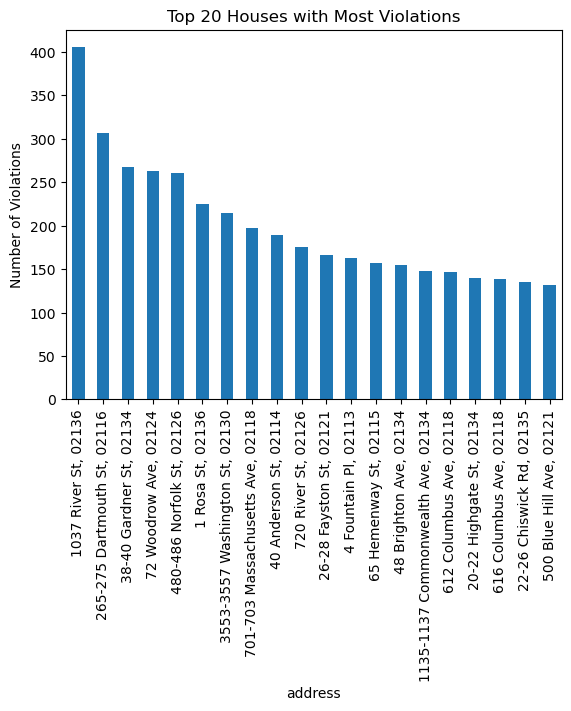

In [ ]:
# Plotting a bar graph for the Top 20 houses with the highest number of violations (same Top 20 from Top 55 in the previous cell)

plt.ylabel("Number of Violations")
plt.title("Top 20 Houses with Most Violations")
rentsmart.groupby(['address'])['address'].count().nlargest(n = 20).plot(kind = 'bar')

In [ ]:
# Creating a new dataframe "rentsmart_maj_viols" with entries for only the three major violations: Building Violations, Housing Complaints, Sani

rentsmart_maj_viols = rentsmart[rentsmart['violation_type'].isin(['Building Violations','Housing Complaints', 'Sanitation Requests'])]

In [ ]:
# Printing the head of this new DataFrame

rentsmart_maj_viols.head()

,date,violation_type,description,address,neighborhood,zip_code,parcel,owner,year built,year remodeled,property_type,latitude,longitude
158,2022-11-17T22:05:19,Sanitation Requests,Rodent Activity,"1756 Columbia Rd, 02127",South Boston,2127,702665000,SEVENTEEN-56 COLUMBIA RD,1925.0,2004.0,Condominium Main*,42.33057,-71.032280
159,2022-11-17T20:58:00,Housing Complaints,"Heat - Excessive, Insufficient","5 Union Ave # 89, 02130",Jamaica Plain,2130,1102535006,UNION-GREEN REALTY LLC MASS LLC,1899.0,1999.0,Mixed Use (Res. and Comm.),42.30974,-71.106000
160,2022-11-17T20:52:33,Sanitation Requests,Abandoned Vehicles,"12 Parkman St, 02122",Dorchester,2122,1600734000,LY DAVID THAI,1905.0,NaN,Residential 1-family,42.29657,-71.060310
161,2022-11-17T20:13:51,Sanitation Requests,Abandoned Vehicles,"219-221 I St, 02127",South Boston,2127,701999000,219 I STREET LLC,1900.0,2007.0,Residential 2-family,42.33081,-71.040000
162,2022-11-17T18:38:33,Sanitation Requests,Abandoned Bicycle,"906 Truman Pkwy, 02136",Hyde Park,2136,1809973000,HORNE STEVEN L,1950.0,NaN,Residential 1-family,42.24525,-71.125816


In [ ]:
# Printing the shape of this new DataFrame

rentsmart_maj_viols.shape

(96384, 13)

<AxesSubplot:title={'center':'Top 20 Houses with Most Major Violations'}, xlabel='Number of Violations', ylabel='address'>

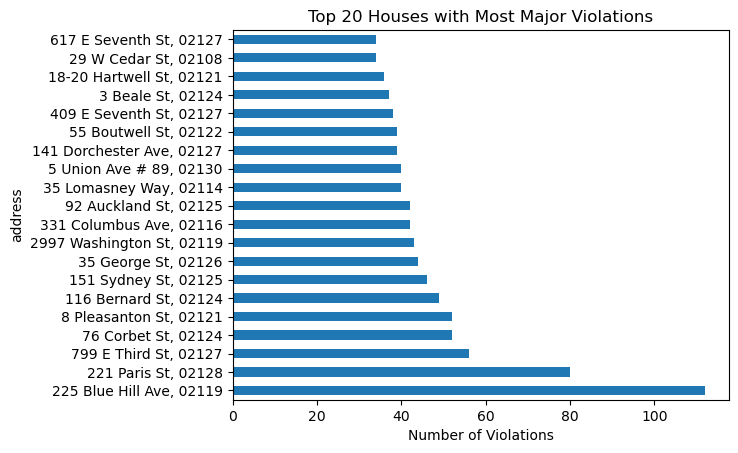

In [ ]:
# Plotting a bar graph for the Top 20 houses with the highest number of major violations

plt.xlabel("Number of Violations")
plt.title("Top 20 Houses with Most Major Violations")
rentsmart_maj_viols.groupby(['address'])['address'].count().nlargest(n = 20).plot(kind = "barh")

In [ ]:
# Printing the count of each type of violation in the rentsmart dataset

rentsmart.violation_type.value_counts()

Enforcement Violations        208419
Housing Complaints             54090
Sanitation Requests            39007
Civic Maintenance Requests      4987
Building Violations             3287
Housing Violations               732
Name: violation_type, dtype: int64

In [ ]:
# Assigning weights to each type of violation based on the severity of the violation

viol_weights = {
                    'Housing Complaints': 1.0,
                    'Sanitation Requests': 0.9,
                    'Civic Maintenance Requests': 0.1,
                    'Building Violations': 0.8,
                    'Housing Violations': 0.4,
                    'Enforcement Violations': 0.0,
    
               }

In [ ]:
# Initializing a dictionary to hold the violation scores of each property in the Rentsmart dataset

house_scores = {}

In [ ]:
# Finding the violation score of each property in the Rentsmart dataset and printing them

for i in range(rentsmart.shape[0]):
    if rentsmart['address'][i] in house_scores.keys():
        house_scores[rentsmart['address'][i]] += viol_weights[rentsmart['violation_type'][i]]
    else:
        house_scores[rentsmart['address'][i]] = viol_weights[rentsmart['violation_type'][i]]
house_scores

{'325-327 Dorchester St, 02127': 3.0,
 '7 Aberdeen St, 02215': 0.0,
 '62 H St, 02127': 0.0,
 '9 Anderson St, 02114': 0.0,
 '46-48 Irving St, 02114': 11.1,
 '3 Sentry Hill Pl, 02114': 3.0,
 '68 N Margin St, 02113': 5.7,
 '24 Brimmer St, 02108': 2.7,
 '40 Anderson St, 02114': 11.700000000000001,
 '97 W Cedar St, 02114': 5.4,
 '16 Foster St, 02109': 5.7,
 '11 Grove St, 02114': 3.9,
 '4 Cleveland Pl, 02113': 12.0,
 '7-9 Henchman St, 02113': 0.0,
 '14 Foster St, 02109': 0.0,
 '29 Bowdoin St, 02114': 5.7,
 '119-123 Richmond St, 02109': 0.0,
 '267-269 North St, 02109': 2.4000000000000004,
 '44 Irving St, 02114': 5.7,
 '1-9 Primus Ave, 02114': 5.4,
 '35 N Margin St, 02113': 12.0,
 '7 Anderson St, 02114': 0.0,
 '1 Acorn St, 02108': 8.4,
 '57-61 Salem St, 02113': 8.100000000000001,
 '13 Anderson St, 02114': 0.0,
 '92-96 Salem St, 02113': 0.0,
 '7 Charles St, 02114': 0.0,
 '9 Wiget St, 02113': 5.4,
 '67A Phillips St, 02114': 0.0,
 '141-143 Charles St, 02114': 2.7,
 '48 Lanark Rd, 02135': 5.4,
 '2

In [ ]:
# Arranging the house scores in Descending order (so that the list of houses are from worst to best according to the violation score metric)

asc_house_scores = sorted(house_scores.items(), key=lambda kv: kv[1], reverse = True)

In [ ]:
# Converting the sorted set into a dictionary

asc_house_scores = dict(asc_house_scores)

In [ ]:
# Printing the sorted dictionary with the worst houses (houses with the highest violation score) on the top i.e. 223 Blue Hill Ave, 02119 is the worst house

asc_house_scores

{'225 Blue Hill Ave, 02119': 335.1,
 '221 Paris St, 02128': 240.29999999999998,
 '799 E Third St, 02127': 167.40000000000003,
 '116 Bernard St, 02124': 147.0,
 '76 Corbet St, 02124': 140.4000000000004,
 '8 Pleasanton St, 02121': 140.4000000000004,
 '151 Sydney St, 02125': 134.70000000000005,
 '35 George St, 02126': 129.90000000000006,
 '92 Auckland St, 02125': 122.10000000000004,
 '5 Union Ave # 89, 02130': 120.0,
 '35 Lomasney Way, 02114': 119.69999999999999,
 '141 Dorchester Ave, 02127': 116.70000000000002,
 '2997 Washington St, 02119': 116.10000000000025,
 '55 Boutwell St, 02122': 116.10000000000002,
 '331 Columbus Ave, 02116': 113.70000000000024,
 '409 E Seventh St, 02127': 113.1,
 '18-20 Hartwell St, 02121': 104.09999999999998,
 '29 W Cedar St, 02108': 102.89999999999998,
 '617 E Seventh St, 02127': 102.0,
 '3 Beale St, 02124': 99.90000000000015,
 '75 Saint Alphonsus St, 02120': 98.10000000000001,
 '35 Hewins St, 02121': 96.0,
 '41 Bicknell St #3, 02121': 96.0,
 '39 Hemenway St, 0

In [ ]:
# Extracting the Top 20 houses with the highest violation score

import itertools

asc_house_scores_20 = dict(itertools.islice(asc_house_scores.items(), 20)) 

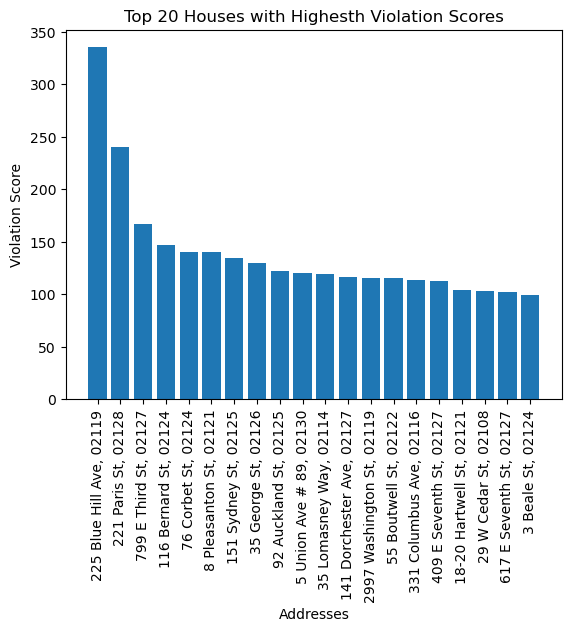

In [ ]:
# Plotting a bar graph for the Top 20 houses with the highest violation score

names = list(asc_house_scores_20.keys())
values = list(asc_house_scores_20.values())

plt.xticks(rotation = 90)
plt.title("Top 20 Houses with Highesth Violation Scores")
plt.xlabel("Addresses")
plt.ylabel("Violation Score")
plt.bar(range(len(asc_house_scores_20)), values, tick_label=names)
plt.show()

In [ ]:
# Creating a DataFrame to store all the houses and their violation scores in Boston city

df = pd.DataFrame(list(asc_house_scores.items()))
df.rename(columns={0: 'Addresses', 1: 'Violation Score'}, inplace = True)
df

,Addresses,Violation Score
0,"225 Blue Hill Ave, 02119",335.1
1,"221 Paris St, 02128",240.3
2,"799 E Third St, 02127",167.4
3,"116 Bernard St, 02124",147.0
4,"76 Corbet St, 02124",140.4
...,...,...
76500,"19 Cortes St # 1, 02116",0.0
76501,"20 Prescott St, 02136",0.0
76502,"290 Congress St, 02110",0.0
76503,"192 Willow St, 02132",0.0


In [ ]:
# Saving the DataFrame in a CSV file

df.to_csv('House_Violation_Scores.csv')

In [ ]:
# Finding the violation score of each owner (one owner might have multiple properties) in the Rentsmart dataset and printing them

owners_scores = {}
for i in range(rentsmart.shape[0]):
    if rentsmart['owner'][i] in owners_scores.keys():
        owners_scores[rentsmart['owner'][i]] += asc_house_scores[rentsmart['address'][i]]
    else:
        owners_scores[rentsmart['owner'][i]] = asc_house_scores[rentsmart['address'][i]]
owners_scores

{'THREE-25 -327 DORCHESTER ST CONDO TR': 215.70000000000002,
 'SEVEN 21 ABERDEEN STREET': 37.800000000000004,
 'SIXTY-2 H STREET CONDO TR': 2.7,
 'EMERALD REALTY CAPITAL LLC MASS LLC': 0.0,
 'BANERJEE GORA C': 389.1000000000001,
 'SNOW ROGER L': 15.0,
 'DELUCA FREDERICK A': 85.50000000000003,
 'CARROLL HAROLD J': 5.4,
 'FORTY ANDERSON STREET LLC MASS LLC': 2256.300000000003,
 'MAGUIRE ROBERT G': 583.4999999999997,
 'SIXTEEN FOSTER ST CONDO TR': 96.90000000000003,
 'ELEVEN GROVE STREET LLC': 159.0000000000001,
 'CASSARINO DIANE L': 72.0,
 'HENCH & COOPER ASSOC LP MASS LP': 3.0,
 'QUARAGLIA DOMENIC': 12.0,
 'TWENTY 9 BOWDOIN STREET': 34.2,
 'L J C LIMITED PARTNERSHIP': 8.4,
 'DELEO FRANCES S': 36.599999999999994,
 'FORTY-4 IRVING STREET LLC MASS LLC': 68.40000000000002,
 'PRIMUS CONDOMINIUM TR': 21.900000000000002,
 'THIRTY-5 NO MARGIN LLC A MASS LLC': 831.0,
 'FREEDMAN LILLIAN Z TS': 787.7999999999989,
 'ROOSEVELT CANDACE C': 50.4,
 'FIFTY 7-61 SALEM ST CONDO TR': 442.80000000000035,
 '

In [ ]:
# Arranging the owner scores in Descending order (so that the list of owners are from worst to best according to the violation score metric)

owners_scores = sorted(owners_scores.items(), key=lambda kv: kv[1], reverse = True)

In [ ]:
# Converting the sorted set into a dictionary

owners_scores = dict(owners_scores)

In [ ]:
# Printing the sorted dictionary with the worst owmers (houses with the highest violation score) on the top i.e. GBM PORTFOLIO OWNER LLC is the worst owner

owners_scores

{'GBM PORTFOLIO OWNER LLC': 40386.30000000034,
 'KASANOF LAND LLC': 39074.09999999995,
 'MCKINLEY INVESTMENT GROUP  LLC': 23083.79999999996,
 'EQR-BACK BAY MANOR LLC': 11281.500000000024,
 'WILMINGTON TRUST NATIONAL': 11270.399999999983,
 'RADCLIFFE RUSSELL F ETAL': 9541.79999999999,
 'STONY BROOK CONDOMINIUM TR': 9083.100000000011,
 'STAMATOS JAMES C TS': 8237.699999999988,
 'BAKER THOMAS': 7995.299999999993,
 'OCONNOR DOROTHY': 7465.500000000026,
 'TALBOT BERNARD HOUSING LLC MASS LLC': 7377.599999999999,
 'PREVOST RUTH': 7300.800000000026,
 'MILLER DWIGHT': 6901.200000000007,
 'FLYNN KATHLEEN': 6883.800000000008,
 'GERMAIN MARC H': 5966.700000000017,
 'NORTHAMPTON SQ CONDO ASSOC': 5931.299999999998,
 'CHARLES RIVER PARK D COMPANY': 5893.499999999995,
 'VIVIENDAS LLC': 5603.999999999999,
 'COURT SQUARE PRESS BUILDING': 5495.999999999996,
 'CONNOLLY DIANE M': 5386.8,
 'MA YU KUN': 5372.400000000003,
 'HELGE CUMMINS LLC': 5276.0999999999885,
 'UNION-GREEN REALTY LLC MASS LLC': 4941.5999

In [ ]:
# Printing the length of the owner_scores dictionary (depicting the total number of owners)

len(owners_scores)

44926

In [ ]:
# Verifying the length of unique owners in the Rentsmart Dataset to see if there are any ducplicate entries (there are none as it can be seen)

len(rentsmart['owner'].unique())

44926

In [ ]:
# Extracting the Top 20 owners with the highest violation score

owners_scores_20 = dict(itertools.islice(owners_scores.items(), 20))

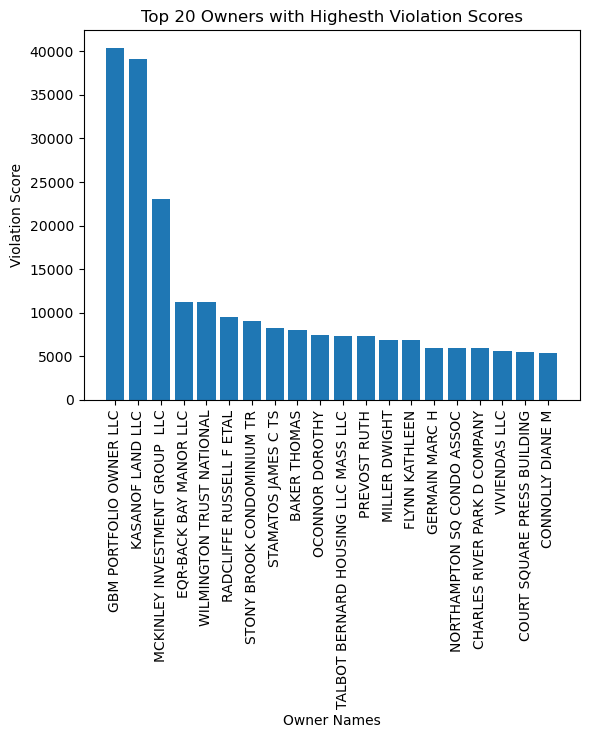

In [ ]:
# Plotting a bar graph for the Top 20 owners with the highest violation score

names = list(owners_scores_20.keys())
values = list(owners_scores_20.values())

plt.xticks(rotation = 90)
plt.title("Top 20 Owners with Highesth Violation Scores")
plt.xlabel("Owner Names")
plt.ylabel("Violation Score")
plt.bar(range(len(asc_house_scores_20)), values, tick_label=names)
plt.show()

In [ ]:
# Creating a DataFrame to store all the house owners (or landlords) and their violation scores in Boston city

df = pd.DataFrame(list(owners_scores.items()))
df.rename(columns={0: 'Owner', 1: 'Violation Score'}, inplace = True)
df

,Owner,Violation Score
0,GBM PORTFOLIO OWNER LLC,40386.3
1,KASANOF LAND LLC,39074.1
2,MCKINLEY INVESTMENT GROUP LLC,23083.8
3,EQR-BACK BAY MANOR LLC,11281.5
4,WILMINGTON TRUST NATIONAL,11270.4
...,...,...
44921,TRINH TU V,0.0
44922,CHRISTOS ALEX,0.0
44923,FORD TIMOTHY P,0.0
44924,IOAKIMIDIS VASILIKI,0.0


In [ ]:
# Saving the DataFrame in a CSV file

df.to_csv('Owner_Violation_Scores.csv')

In [ ]:
# Printing the names of all neighborhoods in the Rentsmart dataset

rentsmart['neighborhood'].unique()

array(['South Boston', 'Boston', 'Brighton', 'Allston', 'Dorchester',
       'Hyde Park', 'Mattapan', 'Roxbury', 'Roslindale', 'Mission Hill',
       'Jamaica Plain', 'East Boston', 'Charlestown', 'West Roxbury',
       'Chestnut Hill', nan], dtype=object)

In [ ]:
# Counting the number of violations per neighborhood in the dataset

viol_count = {}
for i in range(rentsmart.shape[0]):
    if rentsmart['neighborhood'][i] not in viol_count.keys():
        viol_count[rentsmart['neighborhood'][i]] = 1
    else:
        viol_count[rentsmart['neighborhood'][i]]+=1

In [ ]:
# Printing the number of violations per neighborhood

viol_count

{'South Boston': 21174,
 'Boston': 60838,
 'Brighton': 19924,
 'Allston': 16195,
 'Dorchester': 74090,
 'Hyde Park': 9863,
 'Mattapan': 14651,
 'Roxbury': 31969,
 'Roslindale': 8768,
 'Mission Hill': 12112,
 'Jamaica Plain': 11534,
 'East Boston': 17581,
 'Charlestown': 7182,
 'West Roxbury': 4542,
 'Chestnut Hill': 88,
 nan: 11}

In [ ]:
# Checking to see if the sum of all violations per neighborhood is equal to the total number of violations in the dataset (which it is)

summ = 0
for i in viol_count.keys():
    summ+=neigh_count[i]
print(summ)

310522


In [ ]:
# Importing a dataset containing the number of houses per Boston neighborhood (this file/dataset was created by us)

nohouses = pd.read_csv('Number_of_Houses_per_Neighborhood_Boston.csv')

In [ ]:
# Printing the No. of Houses data

nohouses

,Neighborhood,No. of Houses
0,Allston,12527
1,Brighton,21874
2,Charlestown,9525
3,Dorchester,47965
4,East Boston,18016
5,Hyde Park,12613
6,Jamaica Plain,18891
7,Mattapan,9346
8,Mission Hill,7139
9,Roslindale,12114


In [ ]:
# Printing the shape of the dataset

nohouses.shape

(13, 2)

In [ ]:
# Dropping Boston neighborhood from the violation count since we don't know the no. of houses in that neighborhood

viol_count.pop('Boston')

60838

In [ ]:
# Dropping Chestnut Hill neighborhood from the violation count since we don't know the no. of houses in that neighborhood

viol_count.pop('Chestnut Hill')

88

In [ ]:
# Dropping nan from the violation count (these are the number of violations which did not have neighborhood info)

viol_count.popitem()

(nan, 11)

In [ ]:
# Checking the length of viol_count

len(viol_count)

13

In [ ]:
# Printing viol_count

viol_count

{'South Boston': 21174,
 'Brighton': 19924,
 'Allston': 16195,
 'Dorchester': 74090,
 'Hyde Park': 9863,
 'Mattapan': 14651,
 'Roxbury': 31969,
 'Roslindale': 8768,
 'Mission Hill': 12112,
 'Jamaica Plain': 11534,
 'East Boston': 17581,
 'Charlestown': 7182,
 'West Roxbury': 4542}

In [ ]:
# Converting the no. of houses DataFrame into a dictionary

dict_nohouses = dict(zip(nohouses['Neighborhood'], nohouses['No. of Houses']))

In [ ]:
# Printing this new dictionary

dict_nohouses

{'Allston': 12527,
 'Brighton': 21874,
 'Charlestown': 9525,
 'Dorchester': 47965,
 'East Boston': 18016,
 'Hyde Park': 12613,
 'Jamaica Plain': 18891,
 'Mattapan': 9346,
 'Mission Hill': 7139,
 'Roslindale': 12114,
 'Roxbury': 22034,
 'South Boston': 19140,
 'West Roxbury': 14070}

In [ ]:
# Printing the keys of the no. of houses dictionary

dict_nohouses.keys()

dict_keys(['Allston', 'Brighton', 'Charlestown', 'Dorchester', 'East Boston', 'Hyde Park', 'Jamaica Plain', 'Mattapan', 'Mission Hill', 'Roslindale', 'Roxbury', 'South Boston', 'West Roxbury'])

In [ ]:
# Printing the keys of the no. of violations per neighborhood dictionary (to check if both dictionaries have the same keys and the same no. of keys)

viol_count.keys()

dict_keys(['South Boston', 'Brighton', 'Allston', 'Dorchester', 'Hyde Park', 'Mattapan', 'Roxbury', 'Roslindale', 'Mission Hill', 'Jamaica Plain', 'East Boston', 'Charlestown', 'West Roxbury'])

In [ ]:
# Calculating the ratio of the no. of violations to the no. of houses per neighborhood (i.e. the normalized no. of violations per neighborhood)

normalized = {}
normalized_viols = {}
print(viol_count['South Boston'])
print(dict_nohouses['South Boston'])
for i in viol_count.keys():
    normalized[i] = viol_count[i]/dict_nohouses[i]
normalized

21174
19140


{'South Boston': 1.106269592476489,
 'Brighton': 0.9108530675688031,
 'Allston': 1.2928075357228386,
 'Dorchester': 1.544667987073908,
 'Hyde Park': 0.7819709823198288,
 'Mattapan': 1.5676225123047294,
 'Roxbury': 1.450894072796587,
 'Roslindale': 0.7237906554399868,
 'Mission Hill': 1.6965961619274408,
 'Jamaica Plain': 0.6105552908792546,
 'East Boston': 0.9758547957371225,
 'Charlestown': 0.7540157480314961,
 'West Roxbury': 0.3228144989339019}

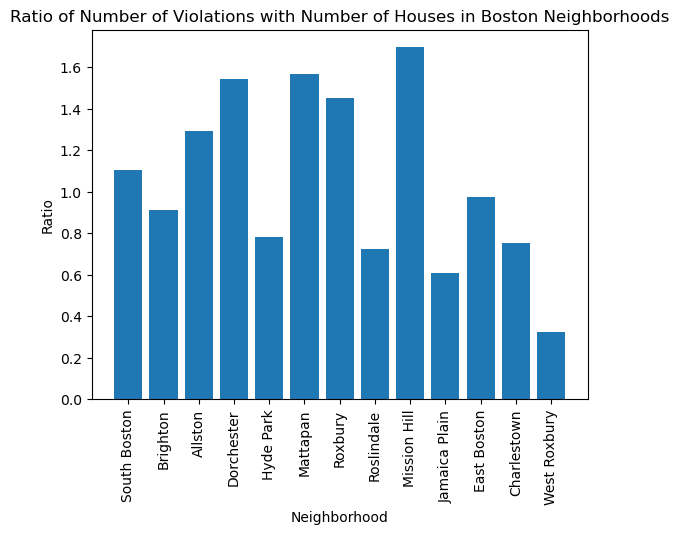

In [ ]:
# Plotting a bar graph for the normalized no. of violations per neighborhood

neighborhoods = list(normalized.keys())
vtohrat = list(normalized.values())

plt.title('Ratio of Number of Violations with Number of Houses in Boston Neighborhoods')
plt.xticks(rotation = 90)
plt.xlabel("Neighborhood")
plt.ylabel("Ratio")
plt.bar(range(len(normalized)), vtohrat, tick_label = neighborhoods)
plt.show()

In [ ]:
# Printing all column names of the Rentsmart dataset

rentsmart.columns

Index(['date', 'violation_type', 'description', 'address', 'neighborhood',
       'zip_code', 'parcel', 'owner', 'year built', 'year remodeled',
       'property_type', 'latitude', 'longitude'],
      dtype='object')

In [ ]:
# Extracting all years in which houses in Boston were built and the number of houses built each year

a = rentsmart['year built'].value_counts()

In [ ]:
# Extracting all years from the dictionary

x = a.keys()

In [ ]:
# Printing the total no. of years in which houses were built in Boston city

len(a)

224

In [ ]:
# Finding the total no. of houses in Boston city (according to the Rentsmart dataset)

summ = 0.0
for i in range(len(a)):
    summ+=a[x[i]]

In [ ]:
# Printing all these years

p = list(x)
p.sort()
p

[1700.0,
 1725.0,
 1752.0,
 1760.0,
 1775.0,
 1780.0,
 1785.0,
 1790.0,
 1792.0,
 1798.0,
 1799.0,
 1800.0,
 1802.0,
 1803.0,
 1805.0,
 1806.0,
 1807.0,
 1809.0,
 1810.0,
 1811.0,
 1812.0,
 1814.0,
 1816.0,
 1818.0,
 1819.0,
 1820.0,
 1821.0,
 1822.0,
 1823.0,
 1824.0,
 1825.0,
 1826.0,
 1827.0,
 1828.0,
 1829.0,
 1830.0,
 1831.0,
 1833.0,
 1834.0,
 1835.0,
 1836.0,
 1837.0,
 1838.0,
 1839.0,
 1840.0,
 1841.0,
 1842.0,
 1843.0,
 1844.0,
 1845.0,
 1846.0,
 1847.0,
 1848.0,
 1849.0,
 1850.0,
 1851.0,
 1852.0,
 1853.0,
 1854.0,
 1855.0,
 1856.0,
 1857.0,
 1858.0,
 1859.0,
 1860.0,
 1861.0,
 1862.0,
 1863.0,
 1864.0,
 1865.0,
 1866.0,
 1867.0,
 1868.0,
 1869.0,
 1870.0,
 1871.0,
 1872.0,
 1873.0,
 1874.0,
 1875.0,
 1876.0,
 1877.0,
 1878.0,
 1879.0,
 1880.0,
 1881.0,
 1882.0,
 1883.0,
 1884.0,
 1885.0,
 1886.0,
 1887.0,
 1888.0,
 1889.0,
 1890.0,
 1891.0,
 1892.0,
 1893.0,
 1894.0,
 1895.0,
 1896.0,
 1897.0,
 1898.0,
 1899.0,
 1900.0,
 1901.0,
 1902.0,
 1903.0,
 1904.0,
 1905.0,
 1906.0,
 

In [ ]:
# Finding the percentage of houses built per year in Boston city

percts = []
for i in range(len(a)):
    percts.append((a[x[i]]/summ)*100)
percts

[13.38881612221343,
 11.557689564394185,
 11.003942368793039,
 10.253400941499915,
 9.65491304742514,
 9.572564225596865,
 6.318488931540248,
 2.119023226258251,
 1.9251468662058588,
 1.5536045440987667,
 1.4790367133093851,
 1.4608810675519706,
 1.1460751384367989,
 1.0711830996874636,
 0.9029191684714243,
 0.8704983724760411,
 0.7122848880185707,
 0.6549000791067423,
 0.6241003229111282,
 0.6156709159523285,
 0.40785361362192163,
 0.35922241962884677,
 0.3300437032330018,
 0.3164269689149408,
 0.3105912256357718,
 0.3070249380762796,
 0.3021618186769721,
 0.2901661241586803,
 0.27654938984061933,
 0.2512611689642204,
 0.24348017792532842,
 0.23569918688643643,
 0.21365304560957582,
 0.20619626253063766,
 0.1987394794516995,
 0.19160690433271518,
 0.1870679928933615,
 0.18512274513363852,
 0.18415012125377703,
 0.16437343569659324,
 0.16177977201696256,
 0.1601587322171934,
 0.1601587322171934,
 0.15594402873779356,
 0.1533503650581629,
 0.15302615709820908,
 0.14200308645977874,
 0.1

In [ ]:
# Extracting the 20 years with the highest percentage of houses built along with their percentages

x = x[:20]
percts = percts[:20]

In [ ]:
# Converting x to a list

x = list(x)

In [ ]:
# Converting the int/float values (years) of x into string

for i in range(len(x)):
    x[i] = str(int(x[i]))
x[0]

'1900'

<BarContainer object of 20 artists>

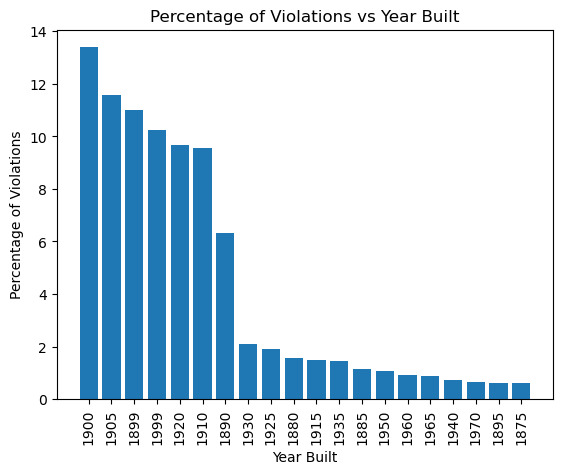

In [ ]:
# Plotting a bar graph for the 20 years when the most percentages of houses were built in Boston city

plt.xticks(rotation = 90)
plt.title("Percentage of Violations vs Year Built")
plt.xlabel("Year Built")
plt.ylabel("Percentage of Violations")
plt.bar(x, percts)

In [ ]:
# Extracting all years in which houses in Boston were remodelled and the number of houses remodelled each year

a = rentsmart['year remodeled'].value_counts()

In [ ]:
# Extracting all years from the dictionary

x = a.keys()

In [ ]:
# Printing all these years

p = list(x)
p.sort()
p

[0.0,
 1900.0,
 1902.0,
 1910.0,
 1919.0,
 1920.0,
 1923.0,
 1925.0,
 1930.0,
 1933.0,
 1934.0,
 1935.0,
 1940.0,
 1941.0,
 1942.0,
 1945.0,
 1946.0,
 1947.0,
 1948.0,
 1949.0,
 1950.0,
 1951.0,
 1952.0,
 1953.0,
 1955.0,
 1956.0,
 1957.0,
 1958.0,
 1959.0,
 1960.0,
 1961.0,
 1962.0,
 1963.0,
 1964.0,
 1965.0,
 1966.0,
 1967.0,
 1968.0,
 1969.0,
 1970.0,
 1971.0,
 1972.0,
 1973.0,
 1974.0,
 1975.0,
 1976.0,
 1977.0,
 1978.0,
 1979.0,
 1980.0,
 1981.0,
 1982.0,
 1983.0,
 1984.0,
 1985.0,
 1986.0,
 1987.0,
 1988.0,
 1989.0,
 1990.0,
 1991.0,
 1992.0,
 1993.0,
 1994.0,
 1995.0,
 1996.0,
 1997.0,
 1998.0,
 1999.0,
 2000.0,
 2001.0,
 2002.0,
 2003.0,
 2004.0,
 2005.0,
 2006.0,
 2007.0,
 2008.0,
 2009.0,
 2010.0,
 2011.0,
 2012.0,
 2013.0,
 2014.0,
 2015.0,
 2016.0,
 2017.0,
 2018.0,
 2019.0]

In [ ]:
# Finding the total no. of houses in Boston city (according to the Rentsmart dataset)

summ = 0.0
for i in range(len(a)):
    summ+=a[x[i]]
summ

202474.0

In [ ]:
# Finding the percentage of houses remodeled per year in Boston city

percts = []
for i in range(len(a)):
    percts.append((a[x[i]]/summ)*100)
percts

[15.611387141065025,
 5.538488892400999,
 5.433290200223238,
 5.4273635133399845,
 4.793701907405396,
 4.004464770785384,
 3.1515157501703923,
 2.9984096723529934,
 2.7499827138299238,
 2.725288185149698,
 2.6250283987079825,
 2.539091438900797,
 2.4729101020377926,
 2.3716625344488675,
 2.3519069115046873,
 2.3044934164386537,
 2.295603386113773,
 2.141509527149165,
 1.9982812608038563,
 1.923703784189575,
 1.7947983444787974,
 1.7498543022807864,
 1.6268755494532634,
 1.6244060965852407,
 1.476238924503887,
 1.4708061281942373,
 1.3749913569149619,
 1.2174402639351225,
 1.182374033209202,
 1.0969309639756215,
 0.8480101148789474,
 0.8139316653002361,
 0.7413297509803728,
 0.72898248664026,
 0.7200924563153788,
 0.6800873198534132,
 0.5724191748076296,
 0.5585902387467032,
 0.52648735146241,
 0.5057439473710205,
 0.4627754674674279,
 0.43166036133034363,
 0.3975819117516323,
 0.3333761371830457,
 0.263243675731205,
 0.22916522615249366,
 0.16100832699507098,
 0.1540938589646078,
 0.11

In [ ]:
# Extracting the 20 years with the highest percentage of houses remodeled along with their percentages

x = x[:20]
percts = percts[:20]

In [ ]:
# Converting x to a list

x = list(x)

<AxesSubplot:title={'center':'Number of Violations based on Year Built'}, xlabel='Year Built', ylabel='Number of Violations'>

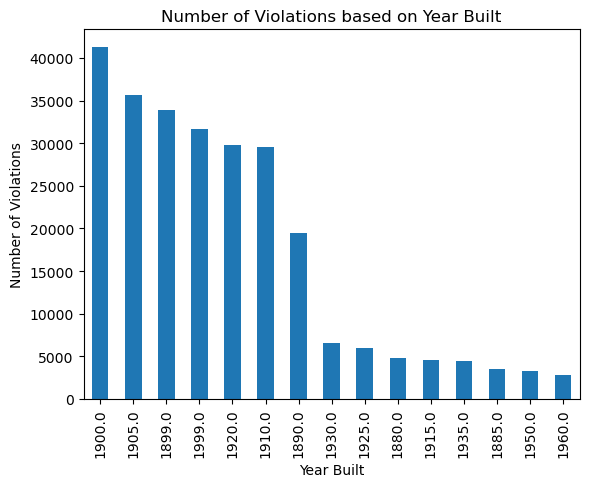

In [ ]:
# Plotting a bar graph for the 20 years when the most percentages of houses were remodelled in Boston city

plt.xlabel("Year Built")
plt.ylabel("Number of Violations")
plt.title("Number of Violations based on Year Built")
rentsmart['year built'].value_counts().nlargest(15).plot(kind="bar")

<AxesSubplot:title={'center':'Number of Violations based on Year Remodeled'}, xlabel='Year Remodeled', ylabel='Number of Violations'>

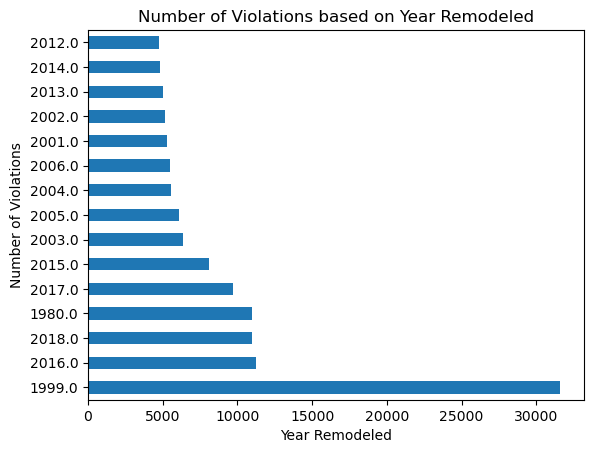

In [ ]:
# Plotting the 15 years which had the highest number of violations (years remodelled)

plt.xlabel("Year Remodeled")
plt.ylabel("Number of Violations")
plt.title("Number of Violations based on Year Remodeled")
rentsmart['year remodeled'].value_counts().nlargest(15).plot(kind="barh")

In [ ]:
# Importing the 311 Service Requests Dataset

service_reqs = pd.read_csv("311 Service Requests.csv")
service_reqs.head()

,case_enquiry_id,open_dt,target_dt,closed_dt,ontime,case_status,closure_reason,case_title,subject,reason,...,police_district,neighborhood,neighborhood_services_district,ward,precinct,location_street_name,location_zipcode,latitude,longitude,source
0,101004143507,2022-01-22 08:14:00,2022-01-25 08:30:00,NaN,OVERDUE,Open,,Pothole,Public Works Department,Highway Maintenance,...,B2,Roxbury,13,9,0904,INTERSECTION Elmwood St & Malcolm X Blvd,NaN,42.3594,-71.0587,City Worker App
1,101004232225,2022-03-24 12:36:00,2022-04-14 12:36:52,2022-03-24 12:37:41,ONTIME,Closed,Case Closed Case Invalid,Request for Recycling Cart,Public Works Department,Recycling,...,B3,Dorchester,7,Ward 17,1714,87-89 River St,2126.0,42.2715,-71.0744,Employee Generated
2,101004194256,2022-02-18 16:48:00,2023-02-18 16:48:41,NaN,ONTIME,Open,,Boston Bikes: Bike Racks; Request,Transportation - Traffic Division,Boston Bikes,...,D14,Boston,14,21,2102,915 Commonwealth Ave,2215.0,42.3518,-71.1168,Constituent Call
3,101004202046,2022-02-26 14:30:00,2022-03-01 08:30:00,NaN,OVERDUE,Open,,Request for Pothole Repair,Public Works Department,Highway Maintenance,...,D14,Allston / Brighton,15,Ward 22,2212,2-8 Arlington St,2135.0,42.3516,-71.1523,Citizens Connect App
4,101004151776,2022-01-30 11:17:00,NaN,2022-01-30 11:31:43,ONTIME,Closed,Case Closed Case Noted,PublicWorks: Compliment,Mayor's 24 Hour Hotline,Employee & General Comments,...,E5,West Roxbury,12,Ward 20,2016,7 Earnshaw St,2132.0,42.2745,-71.1638,Constituent Call


In [ ]:
# Printing the column names in the 311 Service Requests Dataset

service_reqs.columns

Index(['case_enquiry_id', 'open_dt', 'target_dt', 'closed_dt', 'ontime',
       'case_status', 'closure_reason', 'case_title', 'subject', 'reason',
       'type', 'queue', 'department', 'submittedphoto', 'closedphoto',
       'location', 'fire_district', 'pwd_district', 'city_council_district',
       'police_district', 'neighborhood', 'neighborhood_services_district',
       'ward', 'precinct', 'location_street_name', 'location_zipcode',
       'latitude', 'longitude', 'source'],
      dtype='object')

In [ ]:
# Importing the Building and Property Violations Dataset

bp_violations = pd.read_csv("Building and Property Violations.csv")
bp_violations.head()

,case_no,status_dttm,status,code,value,description,violation_stno,violation_sthigh,violation_street,violation_suffix,...,ward,contact_addr1,contact_addr2,contact_city,contact_state,contact_zip,sam_id,latitude,longitude,location
0,HVIOL-644882,2022-11-18 09:50:19,Open,CMR410.550 B,NaN,"Extermination of Insects, Rodents and Skunks -...",19,NaN,Adams,ST,...,15,77 Pond Ave #401,NaN,Brookline,MA,02445,175531,42.3076,-71.0634,"(42.30760000002404, -71.06340000126664)"
1,HVIOL-644882,2022-11-18 09:50:19,Open,CMR410.482 A,NaN,Smoke Detectors & Carbon Monoxide Alarms - Own...,19,NaN,Adams,ST,...,15,77 Pond Ave #401,NaN,Brookline,MA,02445,175531,42.3076,-71.0634,"(42.30760000002404, -71.06340000126664)"
2,HVIOL-644882,2022-11-18 09:50:19,Open,CMR410.482 A,NaN,Smoke Detectors & Carbon Monoxide Alarms - Own...,19,NaN,Adams,ST,...,15,77 Pond Ave #401,NaN,Brookline,MA,02445,175531,42.3076,-71.0634,"(42.30760000002404, -71.06340000126664)"
3,HVIOL-644882,2022-11-18 09:50:19,Open,CRM410.550 D,NaN,"Extermination of Insects, Rodents and Skunks -...",19,NaN,Adams,ST,...,15,77 Pond Ave #401,NaN,Brookline,MA,02445,175531,42.3076,-71.0634,"(42.30760000002404, -71.06340000126664)"
4,HVIOL-644882,2022-11-18 09:50:19,Open,CMR410.550 B,NaN,"Extermination of Insects, Rodents and Skunks -...",19,NaN,Adams,ST,...,15,77 Pond Ave #401,NaN,Brookline,MA,02445,175531,42.3076,-71.0634,"(42.30760000002404, -71.06340000126664)"


In [ ]:
# Printing the column names in the Building and Property Violations Dataset

bp_violations.columns

Index(['case_no', 'status_dttm', 'status', 'code', 'value', 'description',
       'violation_stno', 'violation_sthigh', 'violation_street',
       'violation_suffix', 'violation_city', 'violation_state',
       'violation_zip', 'ward', 'contact_addr1', 'contact_addr2',
       'contact_city', 'contact_state', 'contact_zip', 'sam_id', 'latitude',
       'longitude', 'location'],
      dtype='object')